This notebook details the data cleaning and modeling process that I apply to try and predict Paris city-council elections at the district-level. All the code and data are available in this GitHub repo. 

If you're here, I'm assuming it's because you're at least a little curious about how I coded this bad boy. If so, enjoy the following, and please tell me if you see any issues, mistakes, room for improvement! Finally, if you're mainly interested in the results of the model, you'll find graphs at the end of this notebook, and an interactive Voilà app [just over there](https://mybinder.org/v2/gh/AlexAndorra/pollsposition_models/master?urlpath=%2Fvoila%2Frender%2Fdistrict-level%2Fmunic_model_analysis.ipynb).

All right, enough chatting -- let's import the necessary packages and define useful variables and functions!

In [1]:
import os
import pickle
import warnings

import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc3 as pm
import theano.tensor as tt

from typing import Dict, List

from bokeh.palettes import brewer, cividis
from scipy.special import softmax

In [2]:
az.style.use("arviz-darkgrid")
RANDOM_SEED = 8927
np.random.seed(RANDOM_SEED)

PARTIES = ["farleft", "left", "green", "center", "right", "farright", "other"]
PARTIES_AGG = [
    "farleft_agg",
    "left_agg",
    "green_agg",
    "center_agg",
    "right_agg",
    "farright_agg",
]

In [3]:
def stdz(series: pd.Series) -> pd.Series:
    """Standardize the given pandas Series"""
    return (series - series.mean()) / series.std()

As you'll see, we'll model the elections with a Multinomial likelihood. One of the (many) problems though, is that, sometimes, one of the six main parties (far left, left, green, center, right, far right) won't compete in any given election and district. This translates into missing values in the data, which will make the Multinomial complain (yeah, it's a very whiny distribution).

So, let's load the election results by district and transform every missing values to zero: except for the "other" category (which aggregates all parties except for the big 6), when a party is missing it means that it got 0 vote, so it makes sense to replace `NaN`s by `0`s. Note however that these zeros do not come from the multinomial process -- unlike the zeros in the "other" category -- but from an earlier, unobserved process that determines if any given party competes in the election. We'll deal with that below, but let's already notice that this looks a lot like a zero-inflated process...

Note that the election results are already formatted here. When I downloaded them from the [French Ministry of the Interior](https://www.data.gouv.fr/fr/posts/les-donnees-des-elections/), they were a complete mess -- so much so that I devoted a whole notebook to cleaning and formatting them (see `munic_format_results.ipynb`). Please feel free to use the formatted files for your own analyses -- `results_by_districts_paris.xlsx` and `results_by_departments.xlsx`. I'm still shocked at how messy and inaccessible to the general public these data were, so if I can be of any help, please go ahead.

In [4]:
d = pd.read_excel("../data/results_by_districts_paris.xlsx", index_col=0)

# a party that wasn't there won 0 ballots
d[PARTIES] = d[PARTIES].fillna(0).astype(int)

# remove 2020 results
d = d[d.date != "2020-03-15"]

As may know, Paris is divided into 20 districts (called "arrondissements"). But in 2020, the first four districts were merged into one, so the results are now reported on an aggregated basis for these four districts. Therefore, we have to aggregate the results for these districts during past elections, to get comparable data. For convenient indexing in the model, we'll give this new big district the number 4, as all the other kept their original name -- that way we go from 4 to 5 to 6, etc.

In [5]:
new_districts = (
    d.set_index("arrondissement").loc[:4].groupby(["date", "type"]).sum().reset_index()
)
new_districts["ville"] = "Paris"
new_districts["arrondissement"] = 4

# merge with unchanged districts
d = (
    pd.concat([new_districts, d[d.arrondissement >= 5]], ignore_index=True)
    .set_index(["arrondissement", "date", "type"])
    .sort_index()
)

In the model, we'll use incumbency as a potential predictor of the parties' results. Here, I define incumbency in each district as "the winner of the last election". For instance, if the leftist party won the regional elections in 2015 in the 5th district, it is considered as the incumbent for the next elections held in this district (which were the 2017 presidential elections).

I could have chosen other definitions, like "the winner of the last election _of the same type_" or "the winner of the last _presidential_ elections". These are all interesting hypotheses, so I just picked one, but we could test with another one.

So, with my definition of incumbency, I'm missing the results of the last election held before the very first election in my dataset. This missing election happens to be the 2004 European election, and as there are only 20 districts (or "arrondissements") in Paris, this is easy to just add the results by hand from [this online archive](https://www.liberation.fr/evenement/2004/06/14/europeennes-2004-resultats-circonscription-ile-de-france-75-paris-par-arrondissement_483036):

In [6]:
INCUMBENTS = ["left", "center", "right"]  # only three parties ever won any district
EURO_2004_WINNERS = [
    "left",
    "left",
    "right",
    "right",
    "right",
    "left",
    "left",
    "left",
    "left",
    "left",
    "left",
    "right",
    "right",
    "right",
    "left",
    "left",
    "left",
]

d["winner"] = d[PARTIES[:-1]].idxmax(axis=1)
d["last_winner"] = d.groupby("arrondissement")["winner"].shift(periods=1)
# need last winners for first-ever election in our data set
d = d.fillna(
    {
        "last_winner": pd.Series(
            data=EURO_2004_WINNERS, index=d[d.last_winner.isna()].index
        )
    }
).reset_index()
d

,arrondissement,date,type,N,farleft,left,green,center,right,farright,other,ville,winner,last_winner
0,4,2007-04-22,president,53345,1647,17868,1434,12325,17478,1986,607,Paris,left,left
1,4,2007-06-10,legislative,39243,1805,0,14554,5286,15567,830,1201,Paris,right,left
2,4,2008-03-09,municipale,35410,541,16332,4526,3126,9954,863,68,Paris,left,right
3,4,2009-06-07,european,30416,1976,4711,10143,2509,8267,632,2178,Paris,green,left
4,4,2010-03-14,regional,27891,2172,7598,7164,1117,7342,1262,1236,Paris,left,green
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
216,20,2014-05-25,european,49075,4974,10575,9498,4218,5994,4584,9232,Paris,left,left
217,20,2015-12-06,regional,49130,6100,18315,7348,0,8340,4977,4050,Paris,left,left
218,20,2017-04-23,president,89574,28512,12469,0,27399,11451,5305,4438,Paris,farleft,left
219,20,2017-06-11,legislative,57413,11546,10700,7766,6505,4300,2446,14150,Paris,farleft,farleft


In [7]:
# keep track of which party was the incumbent for each election:
incumbents = pd.get_dummies(d.last_winner)[INCUMBENTS]
incumbents

,left,center,right
0,1,0,0
1,1,0,0
2,0,0,1
3,1,0,0
4,0,0,0
...,...,...,...
216,1,0,0
217,1,0,0
218,1,0,0
219,0,0,0


Now, the model will be time-ignorant, i.e it won't be aware that an election that took place in 2007 carries less information than one that happened in 2017. Don't blame it, it's my fault if I don't know how to do that yet -- but I will soon, for the next one... In the meanwhile, the heuristics I took to pass that information on to the model is to give each year a weight that decays like the half-life of a nuclear element: the older the election, the smaller the weight. The year we predict in (2020) has the biggest weight (1) and then it decays. Next, I multiply these weights with the number of multinomial trials (`N`, i.e the number of people who voted in each district and election). That way, the older the election, the more discarded the associated sample size, which will force the model to take into account the temporal decay of information. Statistically speaking, it's not the cleanest way, but it works and I assert it has some scientific basis in our use-case.

In [8]:
# nuclear decay of elections in time
# the smaller the span, the faster the decay
SPAN_ELECTIONS = 20
ALPHA_ELECTIONS = 2 / (SPAN_ELECTIONS + 1)

TIMELINE = sorted(np.arange(np.min(d.date.dt.year.unique()), 2021), reverse=True)
year_weights = pd.DataFrame(
    index=TIMELINE,
    data=[(1 - ALPHA_ELECTIONS) ** i for i, _ in enumerate(TIMELINE)],
    columns=["year_weights"],
)

# add year_weights to results dataframe:
d.index = d.date.dt.year
d.index.name = "year"
d = d.join(year_weights).sort_values(["arrondissement", "date"]).reset_index(drop=True)

d["N"] = d[PARTIES].multiply(d.year_weights, axis="index").round().sum(1).astype(int)
d[PARTIES] = d[PARTIES].multiply(d.year_weights, axis="index").round().astype(int)
d

,arrondissement,date,type,N,farleft,left,green,center,right,farright,other,ville,winner,last_winner,year_weights
0,4,2007-04-22,president,14521,448,4864,390,3355,4758,541,165,Paris,left,left,0.272236
1,4,2007-06-10,legislative,10683,491,0,3962,1439,4238,226,327,Paris,right,left,0.272236
2,4,2008-03-09,municipale,10655,163,4914,1362,941,2995,260,20,Paris,left,right,0.300893
3,4,2009-06-07,european,10114,657,1567,3373,834,2749,210,724,Paris,green,left,0.332566
4,4,2010-03-14,regional,10252,798,2793,2633,411,2699,464,454,Paris,left,green,0.367573
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
216,20,2014-05-25,european,26919,2728,5801,5210,2314,3288,2514,5064,Paris,left,left,0.548537
217,20,2015-12-06,regional,29785,3698,11104,4455,0,5056,3017,2455,Paris,left,left,0.606278
218,20,2017-04-23,president,66342,21117,9235,0,20293,8481,3929,3287,Paris,farleft,left,0.740633
219,20,2017-06-11,legislative,42523,8551,7925,5752,4818,3185,1812,10480,Paris,farleft,farleft,0.740633


I know what you're thinking: "but, where are your predictors Alex???". Well, here they are! To be as parcimonious as possible and be able to understand what the model is telling us, we'll only use two predictors. The first one is the unemployment rate in Paris on a quarterly basis (at the city level, not the district level, because unfortunately we don't have these data). This variable is historically very well associated with election results -- I'm speaking statistically here, not causally: although it makes sense _a priori_ that unemployment has a causal effect on elections, it is hardly the only one and its effects may come from confounding variables. In short, our causal graph is wayyyyy too small here to make any causal claims!

Let's load the data, downloaded from [Insee](https://www.insee.fr/fr/statistiques/1893230) -- they were clean and a breeze to work with:

In [9]:
unemp = pd.read_excel(
    "../data/predictors/chomage-zone-demploi-2003-2019.xls",
    header=5,
    sheet_name="txcho_ze",
)
unemp = unemp[unemp["LIBZE2010"] == "Paris"].iloc[:, 4:].T
unemp.columns = ["unemployment"]

# as timestamps variables:
unemp.index = pd.period_range(start=unemp.index[0], periods=len(unemp), freq="Q")
unemp

,unemployment
2003Q1,8.4
2003Q2,8.7
2003Q3,8.6
2003Q4,9.0
2004Q1,9.2
...,...
2018Q3,7.7
2018Q4,7.4
2019Q1,7.4
2019Q2,7.2


Now we need to import the poll aggregation for each election, our second predictor. Polls are already aggregated and weighted according to their recency, sample size and historical performance of the pollster. There is a lot going in there, so I wrote another notebook to showcase how I did that (see `munic_agg_polls.ipynb` if you're curious). Let's load those polls now:

In [10]:
polls1 = pd.read_excel("../data/polls_1st_round/aggregated_polls.xlsx", index_col=0)
polls2 = (
    pd.read_excel("../data/polls_1st_round/agg_polls_euro2019.xlsx")
    .iloc[-1]
    .drop(["souv", "other"])
)
polls2.index = polls1.columns[1:]
polls2["type"] = "europeennes"

aggregated_polls = polls1.append(polls2, ignore_index=True)
aggregated_polls[PARTIES_AGG] = aggregated_polls[PARTIES_AGG].div(100)
aggregated_polls.round(2)

,type,dateelection,samplesize_agg,farleft_agg,left_agg,green_agg,center_agg,right_agg,farright_agg
0,president,2007-04-22,1513,0.03,0.24,0.01,0.19,0.27,0.14
1,legislatives,2007-06-10,916,0.07,0.28,0.04,0.11,0.41,0.06
2,municipale,2008-03-09,755,0.04,0.45,0.06,0.08,0.33,0.02
3,europeennes,2009-06-07,2287,0.13,0.20,0.13,0.11,0.27,0.06
4,regionales,2010-03-14,907,0.10,0.29,0.14,0.05,0.29,0.09
5,president,2012-04-22,1400,0.14,0.28,0.03,0.10,0.27,0.16
6,legislatives,2012-06-10,1193,0.08,0.32,0.05,0.03,0.34,0.15
7,municipale,2014-03-23,977,0.06,0.38,0.07,0.00,0.37,0.08
8,europeennes,2014-05-25,3248,0.08,0.17,0.09,0.10,0.21,0.23
9,regionales,2015-12-06,1749,0.05,0.23,0.06,0.00,0.28,0.29


As you probably noticed, the polls are in shares of support. Since our link function is softmax, we need to convert these proportions back on the real line (because the polls will be used before the link function appears in our model). It's [really easy to invert the softmax](https://math.stackexchange.com/questions/2786600/invert-the-softmax-function): we just have to take the log of each proportion and add an arbitrary constant -- here, we chose 1.

But hold on! There are two zeros in these data (for the center party during the 2014 city-council and 2015 regional elections). It's because these parties didn't compete in these elections. When we'll take the logarithm of these zeros, we'll get minus infinity -- spoiler alert: our sampler won't like that. So we'll have to use a trick.

Notice that the green party has a very low share of polls in the 2017 presidential elections. It's because there were some polls featuring the green party at the beginning of the race, but not anymore once the party dropped out. This is useful for us here: as a result, the poll aggregation is very near zero but not _exactly_ zero, so on the log scale it will give a very negative number but not minus infinity.

So here is our trick: let's replace the zeros for the center party by the value for the green party during the 2017 presidential election. This might seem like a cheap trick but it actually makes some conceptual sense: our model is concerned with the _latent_ support of each party's in the population. And in reality, neither the center nor the green parties were at _exactly_ zero percent support during these years -- they just had a very low support, which actually forced them to drop out and make alliances. So, replacing our perfect zeros with not-so-perfect zeros does make sense!

Here is how it looks like in code:

In [11]:
aggregated_polls[PARTIES_AGG] = aggregated_polls[PARTIES_AGG].replace(
    to_replace=0,
    value=aggregated_polls.loc[
        aggregated_polls.dateelection == "2017-04-23", "green_agg"
    ].values[0],
)

# revert the softmax:
aggregated_polls[PARTIES_AGG] = aggregated_polls[PARTIES_AGG].apply(np.log) + 1
aggregated_polls.round(2)

,type,dateelection,samplesize_agg,farleft_agg,left_agg,green_agg,center_agg,right_agg,farright_agg
0,president,2007-04-22,1513,-2.63,-0.43,-3.95,-0.67,-0.30,-0.95
1,legislatives,2007-06-10,916,-1.61,-0.29,-2.30,-1.20,0.12,-1.76
2,municipale,2008-03-09,755,-2.33,0.19,-1.85,-1.51,-0.12,-2.82
3,europeennes,2009-06-07,2287,-1.04,-0.63,-1.01,-1.19,-0.30,-1.85
4,regionales,2010-03-14,907,-1.32,-0.24,-1.00,-2.06,-0.24,-1.40
5,president,2012-04-22,1400,-0.99,-0.29,-2.68,-1.27,-0.32,-0.84
6,legislatives,2012-06-10,1193,-1.53,-0.14,-1.98,-2.58,-0.09,-0.88
7,municipale,2014-03-23,977,-1.88,0.04,-1.73,-22.24,-0.01,-1.50
8,europeennes,2014-05-25,3248,-1.58,-0.79,-1.42,-1.33,-0.54,-0.46
9,regionales,2015-12-06,1749,-1.94,-0.47,-1.84,-22.24,-0.27,-0.24


And now we just have to combine polls, unemployment and election results into the same dataframe:

In [12]:
# add quarters to results dataframe:
d.index = pd.DatetimeIndex(d["date"].values).to_period("Q")
d.index.name = "quarter"
# merge with city-level unemployment:
d = d.join(unemp).sort_values(["arrondissement", "date"]).reset_index(drop=True)

# join polling aggregation:
d = d.merge(
    aggregated_polls.drop("type", 1),
    left_on="date",
    right_on="dateelection",
    how="left",
).drop("dateelection", 1)
d.to_csv("../data/whole_formatted_data.csv")
d

,arrondissement,date,type,N,farleft,left,green,center,right,farright,...,last_winner,year_weights,unemployment,samplesize_agg,farleft_agg,left_agg,green_agg,center_agg,right_agg,farright_agg
0,4,2007-04-22,president,14521,448,4864,390,3355,4758,541,...,left,0.272236,7.8,1513,-2.633513,-0.432471,-3.950292,-0.670963,-0.296018,-0.946153
1,4,2007-06-10,legislative,10683,491,0,3962,1439,4238,226,...,left,0.272236,7.8,916,-1.613136,-0.288538,-2.295177,-1.196553,0.116238,-1.763649
2,4,2008-03-09,municipale,10655,163,4914,1362,941,2995,260,...,right,0.300893,6.6,755,-2.327655,0.190572,-1.849138,-1.513482,-0.116553,-2.824834
3,4,2009-06-07,european,10114,657,1567,3373,834,2749,210,...,left,0.332566,7.9,2287,-1.040641,-0.628886,-1.013539,-1.192074,-0.299655,-1.854871
4,4,2010-03-14,regional,10252,798,2793,2633,411,2699,464,...,green,0.367573,8.2,907,-1.319981,-0.240301,-0.996263,-2.061018,-0.240266,-1.398709
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
216,20,2014-05-25,european,26919,2728,5801,5210,2314,3288,2514,...,left,0.548537,8.8,3248,-1.582788,-0.790411,-1.420928,-1.334419,-0.537229,-0.460404
217,20,2015-12-06,regional,29785,3698,11104,4455,0,5056,3017,...,left,0.606278,8.7,1749,-1.943570,-0.473766,-1.836909,-22.243938,-0.268955,-0.241968
218,20,2017-04-23,president,66342,21117,9235,0,20293,8481,3929,...,left,0.740633,8.0,1555,-0.667318,-1.565596,-22.243938,-0.437694,-0.640817,-0.493163
219,20,2017-06-11,legislative,42523,8551,7925,5752,4818,3185,1812,...,farleft,0.740633,8.0,1299,-1.144984,-1.528224,-2.510045,-0.191539,-0.560378,-0.747776


Finally, let's define some index variables that will be useful to the model, as well as the `coords` corresponding to parameters' shapes, but using names instead of numbers. That way, it'll be more intuitive to write down our model, and our plots and trace will be easier to interpret. This new `coords` and `dims` arguments were added in PyMC 3.9 and rest on ArviZ `InferenceData` capabilities -- you can refer to [this blog post](https://oriolabril.github.io/oriol_unraveled/python/arviz/pymc3/xarray/2020/09/22/pymc3-arviz.html) and [this notebook](https://docs.pymc.io/notebooks/multilevel_modeling.html) for detailed examples and explanation.

In [13]:
district_id_, districts = d.arrondissement.factorize(sort=True)
Ndistricts = len(districts)

type_id_, types = d.type.factorize(sort=True)
Ntypes = len(types)

Nparties = len(PARTIES) - 1

N = d.N.values
R_obs = d[PARTIES].values

COORDS = {
    "district": districts,
    "election_type": types,
    "incumbents": incumbents.columns.to_list(),
    "obs_id": np.arange(len(d)),
    "params_extend": ["local_standing", "log_unemployment", "incumbency"],
    "params_extend_bis": ["local_standing", "log_unemployment", "incumbency"],
    "params_short": ["local_standing", "log_unemployment"],
    "params_short_bis": ["local_standing", "log_unemployment"],
    "party": PARTIES[:-1],
    "party_complete": PARTIES,
}

We also have to tell the model which parties were available for choice during each election. To that end, we'll mark every missing party with a huge, arbitrary value (here, 50,000), so that when we take the softmax the probability for these parties is 0.

In [14]:
parties_available = (
    d[PARTIES]
    .astype(bool)
    .astype(int)
    .iloc[:, :-1]
    .replace(to_replace=0, value=50_000)
    .values
)
parties_available

array([[    1,     1,     1,     1,     1,     1],
       [    1, 50000,     1,     1,     1,     1],
       [    1,     1,     1,     1,     1,     1],
       ...,
       [    1,     1, 50000,     1,     1,     1],
       [    1,     1,     1,     1,     1,     1],
       [    1,     1,     1,     1,     1,     1]])

In [15]:
parties_available = (
    d[PARTIES]
    .astype(bool)
    .astype(int)
    .iloc[:, :-1]
    .replace(to_replace=0, value=-100)
    .replace(to_replace=1, value=0)
    .values
)
parties_available

array([[   0,    0,    0,    0,    0,    0],
       [   0, -100,    0,    0,    0,    0],
       [   0,    0,    0,    0,    0,    0],
       ...,
       [   0,    0, -100,    0,    0,    0],
       [   0,    0,    0,    0,    0,    0],
       [   0,    0,    0,    0,    0,    0]])

Ok, everything's ready, let's define and run our model! This a varying-effects model that takes into account not only the variation in slopes and intercepts across districts, but also accounts for the *covariation between slopes and intercepts* -- it exploits additional information about the population in order to shrink in both dimensions. 

The main cluster the model estimates are the districts: each are different but also somewhat similar to others, so each district contributes information to the overall mean (in this case, this is the whole city) and is in turn influenced by the city-level mean. Of course, more populated districts contribute more information than sparsely populated ones. Therefore, the regression to the mean is stronger for the latter than for the former. This is a nice feature of Bayesian hierarchical models: they automatically juggle between overfitting and underfitting and are not bothered by class imbalance.

In addition to this hierarchical structure, the model has different conservative priors for each of the six parties we're modeling. This makes sense, as parties are not on equal footing for each election -- their respective latent support comes and goes, but they are only rarely all at the same level. 

I also included a type effect, to account for the type of election (city-council, presidential, European...), as voters tend to behave differently. This allows estimates to vary not only by district, but also by type of election. Note that these random effects are not pooled though: there are only 5 distinct types of elections, so estimating a hierachical structure is very hard here -- it's like trying to estimate a population mean and standard deviation with only 5 data points. So, unfortunately, we have to use unpooled parameters for this effect, although partial pooling would make sense -- sometimes, we just have no other choice than to lower our expectations :(

As a final touch, the model accounts for incumbency effects for the three parties that already won elections in some districts (left, center, right). These could lose in importance at the national level, as the political landscape is underlying big changes, but I assume they can still be important at the local level.

Ok, here is what it looks like coded in PyMC3:

In [79]:
with pm.Model(coords=COORDS) as m_prod:
    mus_parties = []
    p_id_bis = 0
    district_id = pm.Data("district_id", district_id_, dims="obs_id")
    type_id = pm.Data("type_id", type_id_, dims="obs_id")
    log_unemployment = pm.Data(
        "log_unemployment", stdz(np.log(d.unemployment)).values, dims="obs_id"
    )
    stdz_polls = pm.Data(
        "stdz_polls", ((d[PARTIES_AGG] - d[PARTIES_AGG].stack().mean()) / d[PARTIES_AGG].stack().std()).values, dims=("obs_id", "party")
    )
    incumbent_indicator = pm.Data(
        "incumbent_indicator", incumbents.values, dims=("obs_id", "incumbents")
    )

    for p_id, p in enumerate(PARTIES_AGG):
        party = p.split("_")[0]
        # prior stddev in intercepts & slopes (variation across districts):
        sd_dist = pm.HalfNormal.dist(1.0)

        if party in incumbents.columns.to_list():
            chol, _, _ = pm.LKJCholeskyCov(
                f"chol_{party}", eta=8, n=3, sd_dist=sd_dist, compute_corr=True
            )

            # average itc and slopes:
            β = pm.Normal(
                f"β_{party}",
                mu=np.array([-1.4, 0.0, 0.0]),
                sd=np.array([0.5, 0.1, 0.1]),
                dims="params_extend",
            )

            # population of varying effects:
            β_district = pm.MvNormal(
                f"β_district_{party}",
                mu=β,
                chol=chol,
                dims=("district", "params_extend"),
            )

            # type-of-election offset:
            type_effect = pm.Normal(
                f"type_effect_{party}", mu=0.0, sigma=0.1, dims="election_type"
            )

            # polls are uncertain
            # sd = 0.035 says uncertainty on polls expected up to 7% of data std 95% of time
            poll_diff = pm.Normal(
                f"poll_diff_{party}", mu=0.0, sigma=0.035, dims="obs_id"
            )
            poll_uncert = stdz_polls[:, p_id] + poll_diff

            # expected value per district:
            mus_parties.append(
                poll_uncert
                + β_district[district_id, 0]  # local standing
                + type_effect[type_id]
                + β_district[district_id, 1] * log_unemployment
                + β_district[district_id, 2]
                * incumbent_indicator[:, p_id_bis]  # incumbency effect
            )
            p_id_bis += 1

        else:
            chol, _, _ = pm.LKJCholeskyCov(
                f"chol_{party}", eta=8, n=2, sd_dist=sd_dist, compute_corr=True
            )
            if party in ["farleft", "green"]:
                β = pm.Normal(
                    f"β_{party}",
                    mu=np.array([-1.9, 0.0]),
                    sd=np.array([0.5, 0.1]),
                    dims="params_short",
                )
            else:
                β = pm.Normal(
                    f"β_{party}",
                    mu=np.array([-2.8, 0.0]),
                    sd=np.array([0.5, 0.1]),
                    dims="params_short",
                )
            β_district = pm.MvNormal(
                f"β_district_{party}",
                mu=β,
                chol=chol,
                dims=("district", "params_short"),
            )
            type_effect = pm.Normal(
                f"type_effect_{party}", mu=0.0, sigma=0.1, dims="election_type"
            )
            poll_diff = pm.Normal(
                f"poll_diff_{party}", mu=0.0, sigma=0.035, dims="obs_id"
            )
            poll_uncert = stdz_polls[:, p_id] + poll_diff
            mus_parties.append(
                poll_uncert
                + β_district[district_id, 0]
                + type_effect[type_id]
                + β_district[district_id, 1] * log_unemployment
            )

    mus_parties = tt.as_tensor_variable(mus_parties).T
    # account for systematic polling errors, media narratives, “October surprises":
    #noisy_mus = pm.Normal("noisy_mus", mus_parties, 0.035, dims=("obs_id", "party"))

    # zero-inflation process:
    # push non-available parties towards -inf:
    #noisy_mus = noisy_mus + parties_available  # * parties_available
    mus_parties = pm.Deterministic("mus_parties", mus_parties + parties_available, dims=("obs_id", "party"))  # * parties_available

    # append last category:
    vary_pivot = pm.Normal("vary_pivot", mu=-3.0, sigma=0.05, dims="obs_id")
    mus_parties = tt.horizontal_stack(mus_parties, vary_pivot[:, None])

    # preferences of each district, for each election:
    p_district = pm.Deterministic(
        "p_district", tt.nnet.softmax(mus_parties), dims=("obs_id", "party_complete")
    )

    R = pm.Multinomial("R", n=N, p=p_district, observed=R_obs, dims="obs_id") # "party_complete"

    prior_checks = pm.sample_prior_predictive(random_seed=RANDOM_SEED)
pm.model_to_graphviz(m_prod)

Yeah, this is a big baby... And because of both the softmax inverse link and the hierarchical structure, we have to be very careful with our priors -- otherwise, our model won't run, and, most importantly, won't really make sense. The good thing in this model is that all parameters are offsets (i.e intercepts that describe a deviation from a baseline):

$$National \ polls + \alpha_{local \ standing} + \alpha_{election \ type} + \beta_{unemployment} \times \log(unemployment) + \beta_{incumbency} \times \mathbf{I}_{incumbent}$$

So this means we can center all our priors around 0, which is quite nice and intuitive. We still have to think about our priors for standard deviations though, and they are on the logit scale (or... should we say softgit here?) and they all interact, soooooo they are not very intuitive to reason about.

The best way to make sense of our priors is actually to simulate samples, push them through the model and plot everything on the outcome scale (the probability of each party). There isn't one perfect way to do this, so I tried several things to get an intuition of what our priors mean. 

First, the function `prior_pred_checks` will compute how probabilities evolve with the values of a predictor -- to see this impact, the other predictors are held at zero. Remember that our continuous predictors are standardized, so a range from -3 to 4 should be enough to encompass their real values:

In [51]:
def prior_push_checks(
    pp_samples: Dict[str, np.array], pred_values: List[float]
) -> Dict[float, np.array]:
    """
    Takes the prior pushforward samples of the districts' intercepts and slopes coefficients
    and pushes them through the model to get the prior predictive probabilities of each party.
    To see the impact of predictors on probabilities, only one predictor is changed and takes
    the values in pred_values. The other predictors are held constant at zero.
    We arbitrarily fix the type effect at index 0 (European elections).
    -----------------------------------------------------------------------------------------
    pp_samples: raw prior predictive samples from the model.
    pred_values: list of values we want the standardized predictor to take.
    """
    pp_at = {}

    for predictor in pred_values:
        pp_mus = []
        for p_id, p in enumerate(PARTIES_AGG):
            party = p.split("_")[0]
            pp_mus.append(
                prior_checks[f"β_district_{party}"][:, 0]
                + prior_checks[f"type_effect_{party}"][:, 0]
                + predictor * prior_checks[f"β_district_{party}"][:, 1]
            )
        pp_mus = np.asarray(pp_mus)
        pp_noisy_mus = pm.Normal.dist(mu=pp_mus, sigma=0.08).random(size=(pp_mus.shape))
        pp_vary_pivot = pm.Normal.dist(mu=-3.0, sigma=0.1).random(
            size=(1, pp_mus.shape[1])
        )
        pp_noisy_mus = np.r_[pp_noisy_mus, pp_vary_pivot]
        pp_at[predictor] = softmax(pp_noisy_mus, axis=0)

    return pp_at

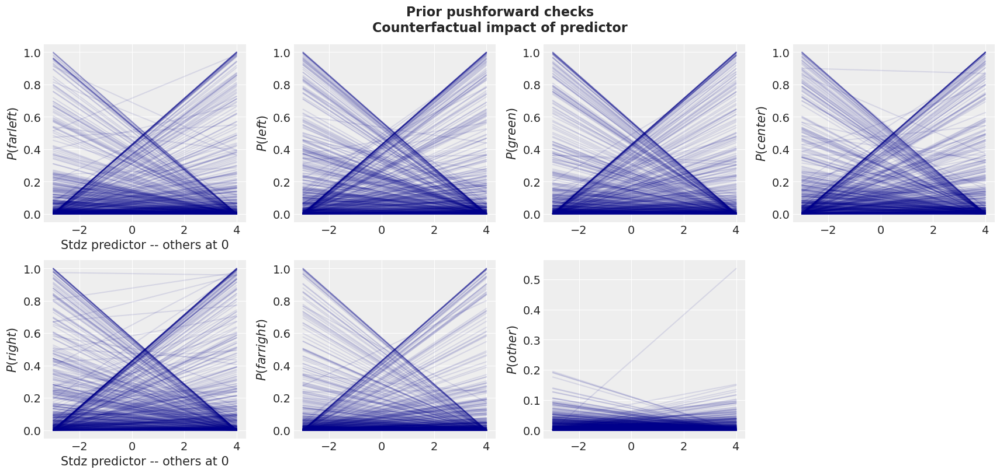

In [66]:
prior_probs = prior_push_checks(prior_checks, [-3.0, 4.0])

fig, axes = plt.subplots(2, 4, figsize=(17, 8), constrained_layout=True)
axes = np.ravel(axes)
axes[-1].remove()
for i, ax in enumerate(axes):
    try:
        for p in zip(prior_probs[-3.0][i], prior_probs[4.0][i]):
            ax.plot([-3, 4], p, color="darkblue", alpha=0.1)
        if not i % 4:
            ax.set_xlabel("Stdz predictor -- others at 0")
        ax.set_ylabel(f"$P({PARTIES[i]})$")
    except IndexError:
        continue
plt.suptitle(
    "Prior pushforward checks\nCounterfactual impact of predictor",
    fontsize=16,
    fontweight="bold",
);

Now, let's account for all sources of uncertainty in our model, and see what our priors mean on average on the outcome scale:

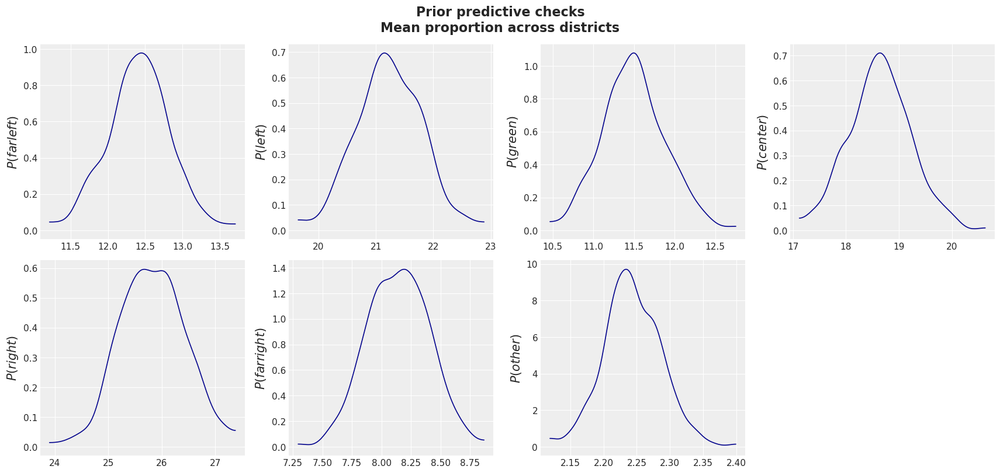

In [67]:
fig, axes = plt.subplots(2, 4, figsize=(17, 8), constrained_layout=True)
axes = np.ravel(axes)
axes[-1].remove()
for i, ax in enumerate(axes):
    try:
        az.plot_dist(
            prior_checks["p_district"].mean(1)[:, i] * 100,
            color="darkblue",
            ax=ax,
            textsize=11,
        )
        ax.set_ylabel(f"$P({PARTIES[i]})$")
    except IndexError:
        continue
plt.suptitle(
    "Prior predictive checks\nMean proportion across districts",
    fontsize=16,
    fontweight="bold",
);

But of course, the strength of this model is to make predictions at the district level, so let's see what it's expecting in each district and for each election _before seeing any data_:

In [68]:
share_est = prior_checks["p_district"]
share_mean = share_est.mean(0)

elections = list(d.date.unique())

/Users/alex_andorra/opt/anaconda3/envs/elections-models/lib/python3.8/site-packages/arviz/stats/stats.py:484: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(
/Users/alex_andorra/opt/anaconda3/envs/elections-models/lib/python3.8/site-packages/arviz/stats/stats.py:484: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(
/Users/alex_andorra/opt/anaconda3/envs/elections-models/lib/python3.8/site-packages/arviz/stats/stats.py:484: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  warnings.warn(
/Users/alex_andorra/opt/anaconda3/envs/elections-models/lib/python3.8/site-packages/arviz/stats/stats.py:484: FutureWarning: hdi currently interp

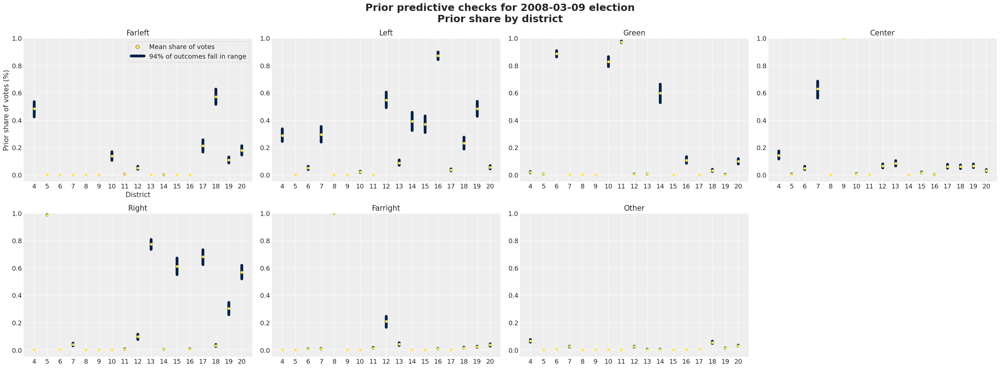

In [76]:
if len(elections) == 0:
    raise ValueError("The list of elections is empty -- no more graphs to plot!")
election = np.random.choice(elections)
elections.remove(election)
election_mask = d.date == election

fig, axes = plt.subplots(2, 4, figsize=(30, 11), constrained_layout=True)
axes = np.ravel(axes)
axes[-1].remove()
for i, ax in enumerate(axes):
    try:
        ax.plot(
            [np.arange(Ndistricts), np.arange(Ndistricts)],
            az.hdi(share_est[:, election_mask, i]).T,
            color=cividis(3)[0],
            lw=6,
        )
        ax.plot(
            np.arange(Ndistricts),
            share_mean[election_mask, i],
            "o",
            color=cividis(3)[2],
            ms=5,
        )
        ax.set_xticks(np.arange(Ndistricts))
        ax.set_xticklabels(districts)
        ax.set_title(f"{PARTIES[i].title()}")
        ax.set_ylim([-0.05, 1.0])
        if i == 0:
            ax.set_xlabel("District")
            ax.set_ylabel("Prior share of votes (%)")
            ax.plot(
                [],
                "o",
                markeredgecolor=cividis(3)[1],
                markeredgewidth=1,
                color=cividis(3)[2],
                ms=8,
                label="Mean share of votes",
            )
            ax.plot(
                [], label="94% of outcomes fall in range", color=cividis(2)[0], lw=6
            )
            ax.legend(frameon=True, framealpha=0.5)
    except IndexError:
        continue
fig.suptitle(
    f"Prior predictive checks for {np.datetime_as_string(election, unit='D')} election\nPrior share by district",
    fontsize=22,
    fontweight="bold",
);

Tada! There are still a lot of implausibly strong relationships, but these priors seem reasonable overall: strong enough to induce regularization of our parameters (they don't allow _crazy_ relationships impossible in reality) and weak enough to be moved by the data (of course data can be moving, you heartless monster!). And we see that some parties are _a priori_ stronger (left, center, right) than others, which shows we successfully incorporated prior knowledge into our model.

And now it's time for the climax of this notebook, for what you were looking for all these years, for the reason why you even started reading it: the sampling of the model (Beethoven's fifth symphony playing in the background)! Now that the model is compiled, it only takes a few line of code with PyMC3, most of them handling our labels for posterior plots. 

The model quite big and complex, but since we thought hard about our priors, it samples a lot of samples in a really reasonable time. If you're not willing to wait for one hour, just trust my run of the model (I saved all the data and samples thanks to ArviZ's NetCDF features). But if you want to see the miracle of Hamiltonian Monte-Carlo happening before your eyes, then run the cell below!

While you're waiting, you can even go give the [PyMC](https://docs.pymc.io/) and [ArviZ](https://arviz-devs.github.io/arviz/) devs a warm thank you for their awesome work -- seriously, do it, I'm sure they'll appreciate. Still got time? Go listen to some of these devs on [my podcast](https://learnbayesstats.anvil.app/), where I interview researchers and practitioners about Bayesian methods #ShamelessSelfPromotion.

In [80]:
with m_prod:
    trace_prod = pm.sample(
        tune=500,
        draws=500,
        cores=8,
        chains=4,
        return_inferencedata=True,
        idata_kwargs={
            "dims": {
                "chol_farleft_stds": ["params_short"],
                "chol_left_stds": ["params_extend"],
                "chol_green_stds": ["params_short"],
                "chol_center_stds": ["params_extend"],
                "chol_right_stds": ["params_extend"],
                "chol_farright_stds": ["params_short"],
                "chol_farleft_corr": ["params_short", "params_short_bis"],
                "chol_left_corr": ["params_extend", "params_extend_bis"],
                "chol_green_corr": ["params_short", "params_short_bis"],
                "chol_center_corr": ["params_extend", "params_extend_bis"],
                "chol_right_corr": ["params_extend", "params_extend_bis"],
                "chol_farright_corr": ["params_short", "params_short_bis"],
            }
        },
    )
az.summary(
    trace_prod,
    var_names=[f"β_{p}" for p in PARTIES[:-1]] + [r"_stds"],
    filter_vars="regex",
    round_to=2,
)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 8 jobs)
NUTS: [vary_pivot, poll_diff_farright, type_effect_farright, β_district_farright, β_farright, chol_farright, poll_diff_right, type_effect_right, β_district_right, β_right, chol_right, poll_diff_center, type_effect_center, β_district_center, β_center, chol_center, poll_diff_green, type_effect_green, β_district_green, β_green, chol_green, poll_diff_left, type_effect_left, β_district_left, β_left, chol_left, poll_diff_farleft, type_effect_farleft, β_district_farleft, β_farleft, chol_farleft]


Sampling 4 chains for 500 tune and 500 draw iterations (2_000 + 2_000 draws total) took 324 seconds.
The estimated number of effective samples is smaller than 200 for some parameters.


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
β_farleft[0],-3.04,0.18,-3.38,-2.69,0.0,0.0,2066.94,2066.94,2079.22,1468.87,1.00
β_farleft[1],-0.09,0.04,-0.16,-0.03,0.0,0.0,2865.39,2175.10,3023.76,1617.44,1.00
β_left[0],-2.25,0.11,-2.45,-2.01,0.0,0.0,690.54,681.71,685.50,951.19,1.00
β_left[1],-0.08,0.04,-0.16,0.01,0.0,0.0,3410.82,2925.73,3457.47,1283.40,1.00
β_left[2],0.21,0.08,0.07,0.34,0.0,0.0,1756.43,1756.43,1835.16,1472.53,1.00
β_green[0],-2.65,0.15,-2.93,-2.36,0.0,0.0,1975.27,1975.27,1988.12,1129.41,1.01
β_green[1],-0.16,0.04,-0.24,-0.08,0.0,0.0,3984.07,3984.07,4129.66,1303.84,1.00
β_center[0],-2.80,0.09,-2.95,-2.63,0.0,0.0,493.20,493.07,489.28,1220.41,1.01
β_center[1],-0.28,0.06,-0.38,-0.17,0.0,0.0,2246.41,2246.41,2435.27,1344.34,1.00
β_center[2],0.19,0.11,-0.03,0.38,0.0,0.0,2944.05,2225.86,2947.52,1501.60,1.00


In [129]:
m_prod.check_test_point()

chol_farleft_cholesky-cov-packed__          -1.90
β_farleft                                    1.16
β_district_farleft                         -31.24
type_effect_farleft                          6.92
poll_diff_farleft                          458.97
chol_left_cholesky-cov-packed__             -3.60
β_left                                       2.54
β_district_left                            -46.87
type_effect_left                             6.92
poll_diff_left                             458.97
chol_green_cholesky-cov-packed__            -1.90
β_green                                      1.16
β_district_green                           -31.24
type_effect_green                            6.92
poll_diff_green                            458.97
chol_center_cholesky-cov-packed__           -3.60
β_center                                     2.54
β_district_center                          -46.87
type_effect_center                           6.92
poll_diff_center                           458.97


In [32]:
p_district.tag.test_value

array([[0.02006327, 0.20944961, 0.14400628, ..., 0.17121237, 0.19405147,
        0.00773168],
       [0.        , 1.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.02598913, 0.40179306, 0.1537587 , ..., 0.2378699 , 0.00994547,
        0.00561992],
       ...,
       [0.53273484, 0.02320346, 0.        , ..., 0.03191403, 0.23802368,
        0.00500341],
       [0.2879354 , 0.03277228, 0.16162918, ..., 0.05685386, 0.22141142,
        0.00666714],
       [0.15842862, 0.01680389, 0.20079828, ..., 0.0146107 , 0.37152374,
        0.00687319]])

In [33]:
noisy_mus.tag.test_value.round(1)

array([[-2.000000e+00,  3.000000e-01, -1.000000e-01, ...,  1.000000e-01,
         2.000000e-01, -3.000000e+00],
       [-1.000000e-01,  2.616750e+04,  2.000000e-01, ...,  1.600000e+00,
        -9.000000e-01, -3.000000e+00],
       [-1.500000e+00,  1.300000e+00,  3.000000e-01, ...,  7.000000e-01,
        -2.400000e+00, -3.000000e+00],
       ...,
       [ 1.700000e+00, -1.500000e+00, -1.711717e+05, ..., -1.100000e+00,
         9.000000e-01, -3.000000e+00],
       [ 8.000000e-01, -1.400000e+00,  2.000000e-01, ..., -9.000000e-01,
         5.000000e-01, -3.000000e+00],
       [ 1.000000e-01, -2.100000e+00,  4.000000e-01, ..., -2.200000e+00,
         1.000000e+00, -3.000000e+00]])

In [34]:
mus_parties.tag.test_value

array([[-2.04643564,  0.29915662, -0.07546965,  0.48997926,  0.09757814,
         0.22279685],
       [-0.11884064,  0.52334967,  0.22743693,  0.42122891,  1.58573291,
        -0.93120288],
       [-1.46863856,  1.26962021,  0.30906754,  0.37977285,  0.7454069 ,
        -2.42919979],
       ...,
       [ 1.66790408, -1.46581842, -3.42343366,  0.52049222, -1.14707418,
         0.86225042],
       [ 0.76554486, -1.40760815,  0.18811343,  0.55269075, -0.85670723,
         0.50283133],
       [ 0.13767581, -2.10601804,  0.37467251,  0.51462312, -2.24587449,
         0.98998446]])

In [35]:
parties_available

array([[    1,     1,     1,     1,     1,     1],
       [    1, 50000,     1,     1,     1,     1],
       [    1,     1,     1,     1,     1,     1],
       ...,
       [    1,     1, 50000,     1,     1,     1],
       [    1,     1,     1,     1,     1,     1],
       [    1,     1,     1,     1,     1,     1]])

In [25]:
d[PARTIES]

,farleft,left,green,center,right,farright,other
0,448,4864,390,3355,4758,541,165
1,491,0,3962,1439,4238,226,327
2,163,4914,1362,941,2995,260,20
3,657,1567,3373,834,2749,210,724
4,798,2793,2633,411,2699,464,454
...,...,...,...,...,...,...,...
216,2728,5801,5210,2314,3288,2514,5064
217,3698,11104,4455,0,5056,3017,2455
218,21117,9235,0,20293,8481,3929,3287
219,8551,7925,5752,4818,3185,1812,10480


In [81]:
trace_prod.observed_data = trace_prod.observed_data.rename(R_dim_1 = "party_complete").assign_coords(party_complete = trace_prod.posterior["party_complete"])
az.to_netcdf(trace_prod, "trace_prod.nc")
trace_prod

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats
	> observed_data
	> constant_data

In [131]:
trace_prod = az.from_netcdf("trace_prod.nc")

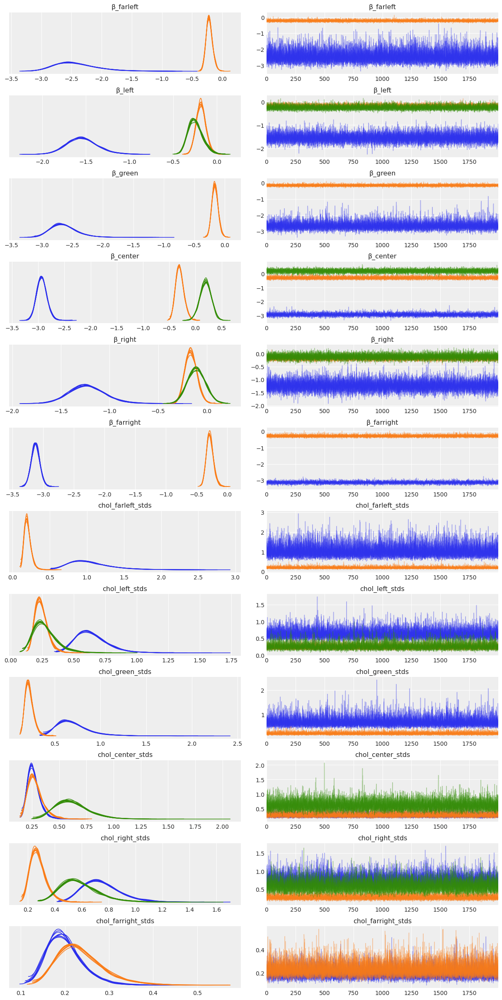

In [24]:
az.plot_trace(
    trace_prod,
    var_names=[f"β_{p}" for p in PARTIES[:-1]] + [r"_stds"],
    filter_vars="regex",
    compact=True,
    chain_prop={"ls": "-"},
);

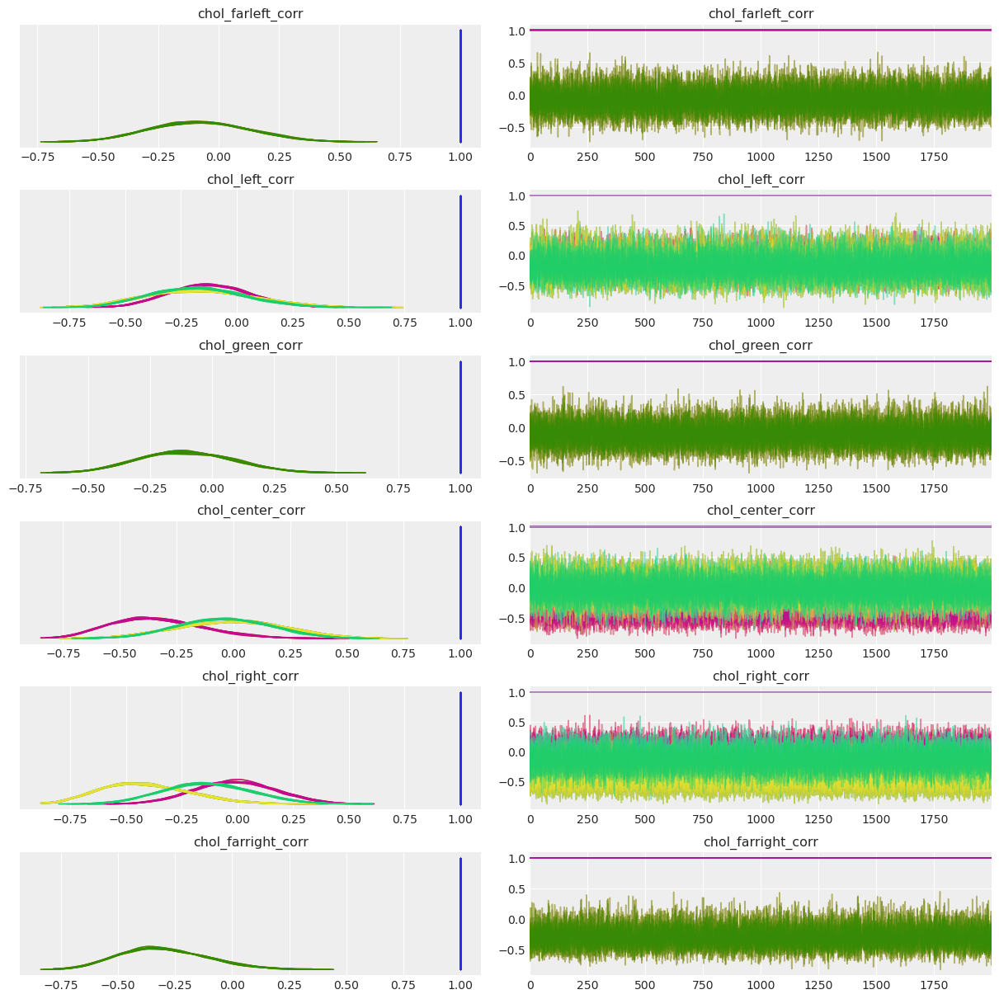

In [25]:
az.plot_trace(
    trace_prod,
    var_names=r"_corr",
    filter_vars="regex",
    compact=True,
    chain_prop={"ls": "-"},
);

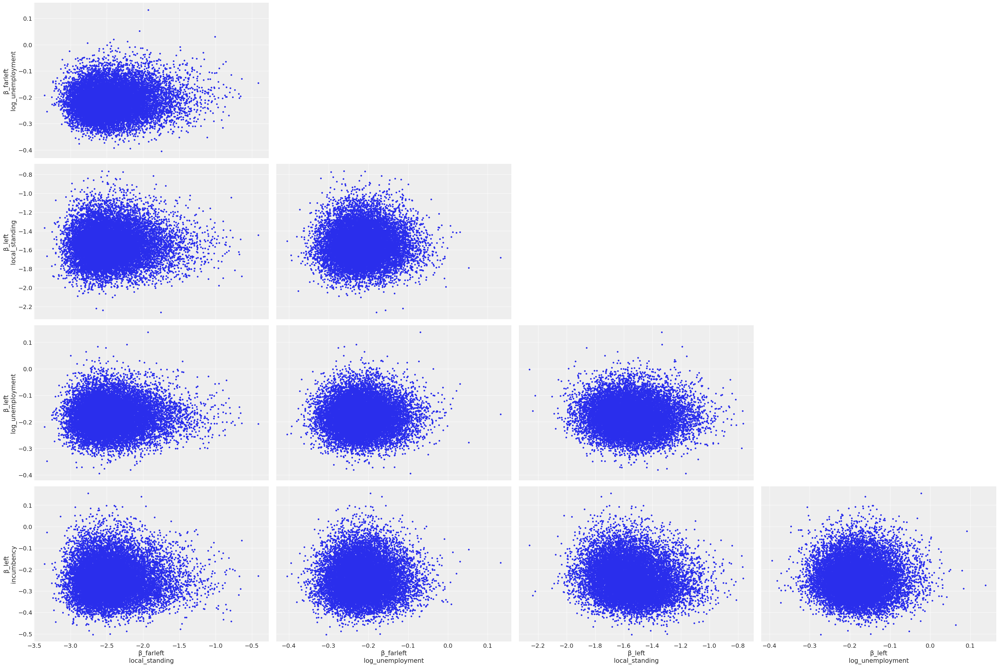

In [26]:
az.plot_pair(
    trace_prod, var_names=[f"β_{p}" for p in PARTIES[:2]], divergences=True,
);

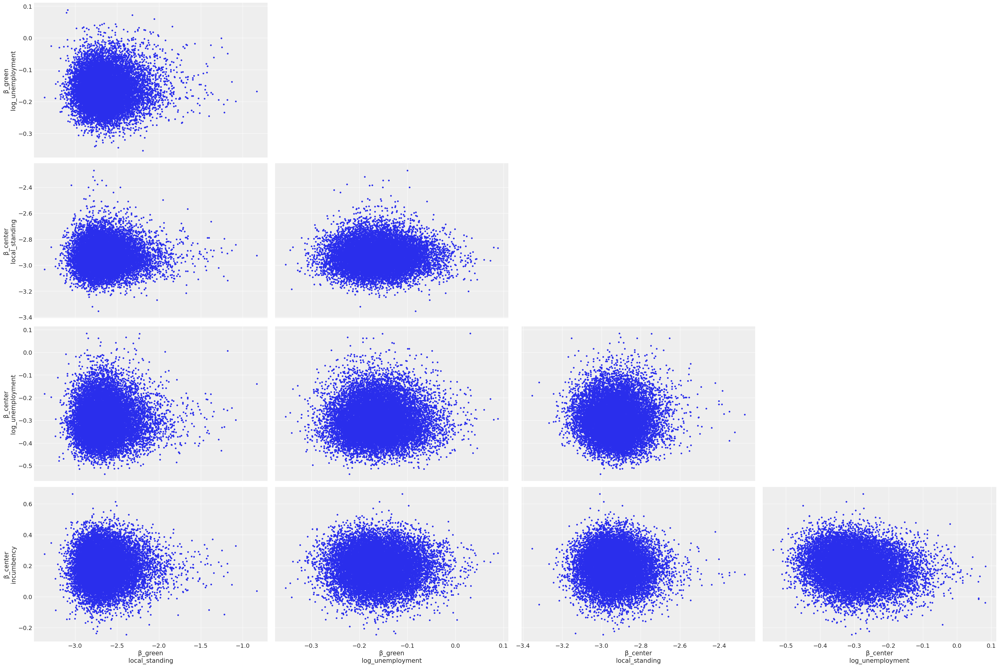

In [27]:
az.plot_pair(
    trace_prod, var_names=[f"β_{p}" for p in PARTIES[2:4]], divergences=True,
);

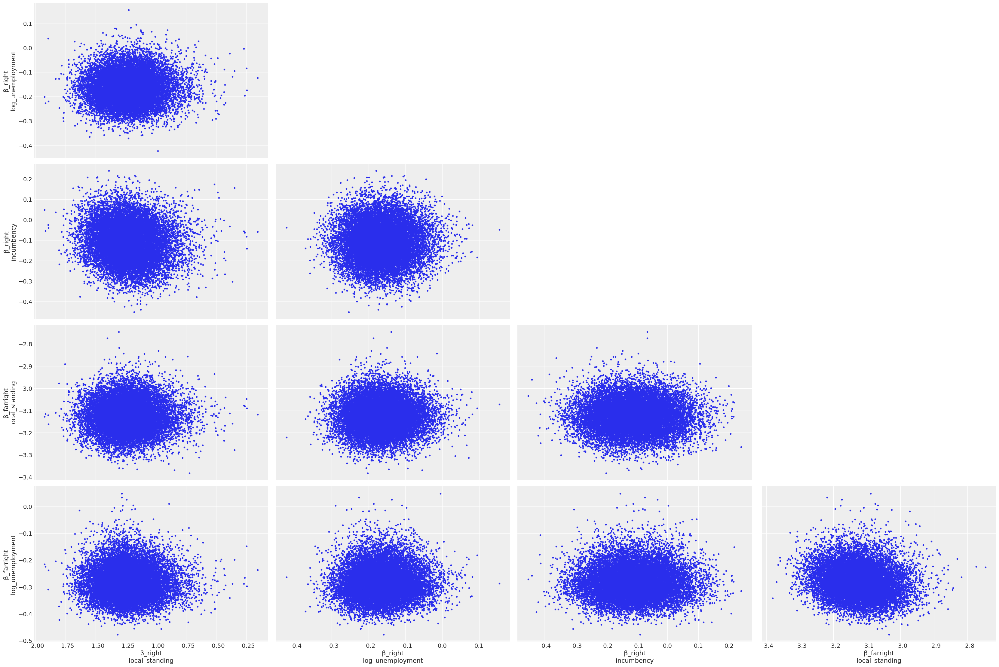

In [28]:
az.plot_pair(
    trace_prod, var_names=[f"β_{p}" for p in PARTIES[4:-1]], divergences=True,
);

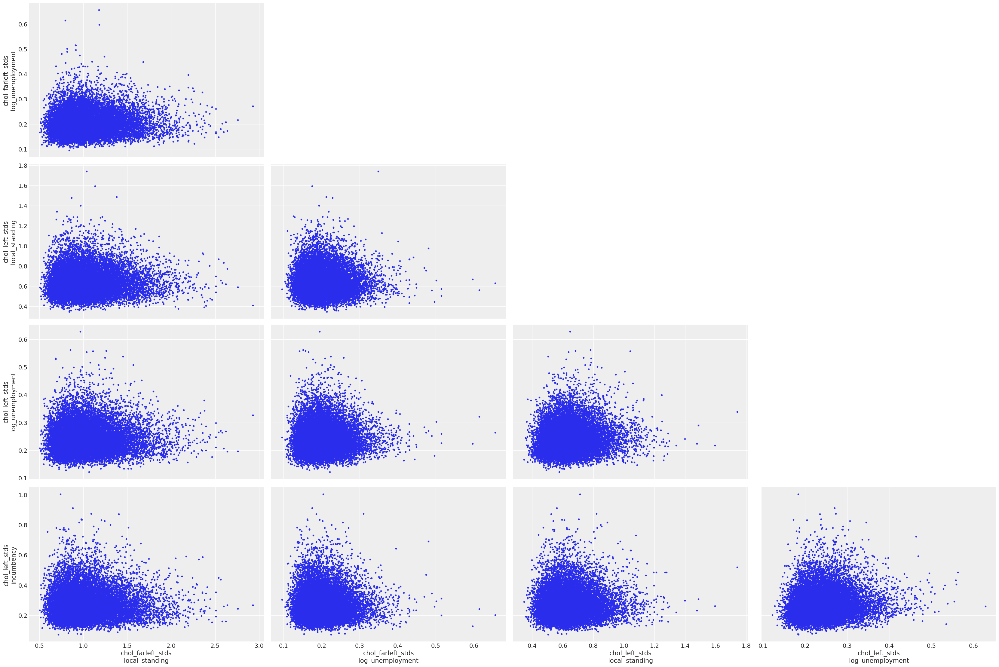

In [29]:
az.plot_pair(
    trace_prod,
    var_names=[r"_farleft_stds", r"_left_stds"],
    filter_vars="regex",
    divergences=True,
);

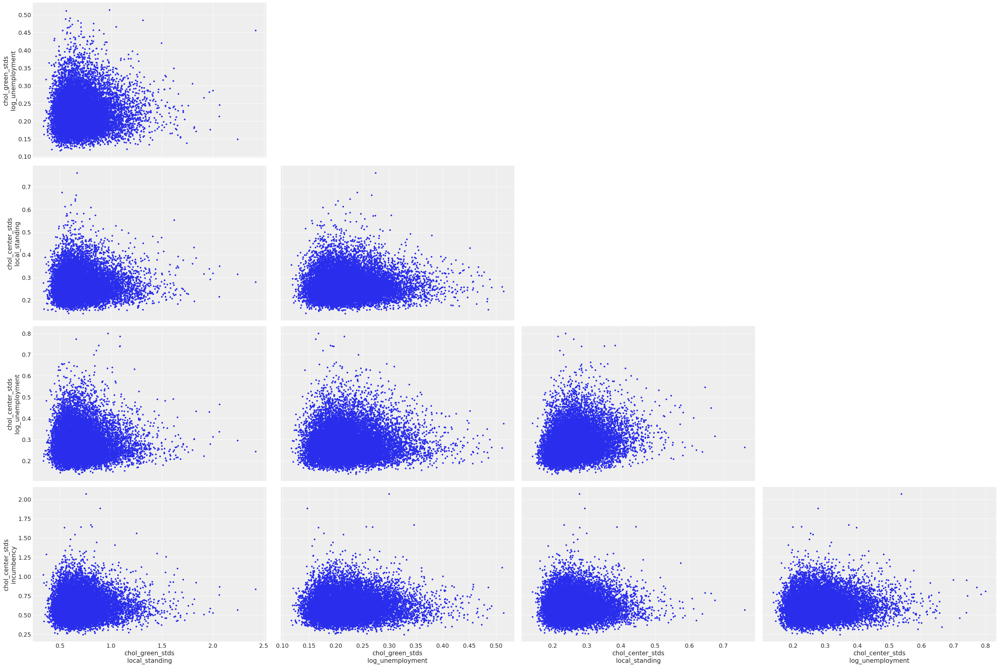

In [30]:
az.plot_pair(
    trace_prod,
    var_names=[r"_green_stds", r"_center_stds"],
    filter_vars="regex",
    divergences=True,
);

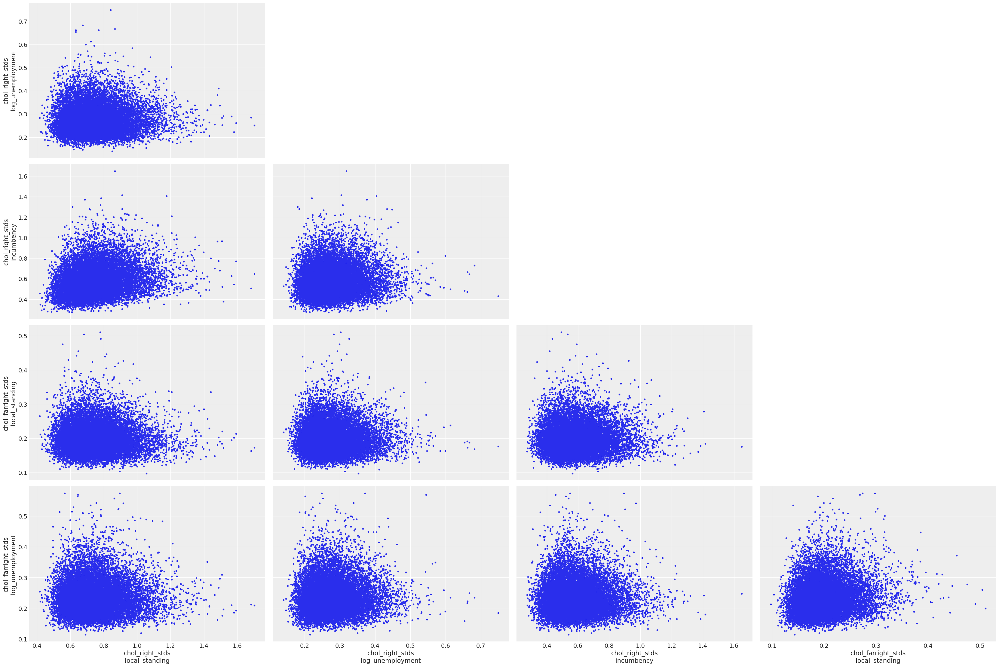

In [31]:
az.plot_pair(
    trace_prod,
    var_names=[r"_right_stds", r"_farright_stds",],
    filter_vars="regex",
    divergences=True,
);

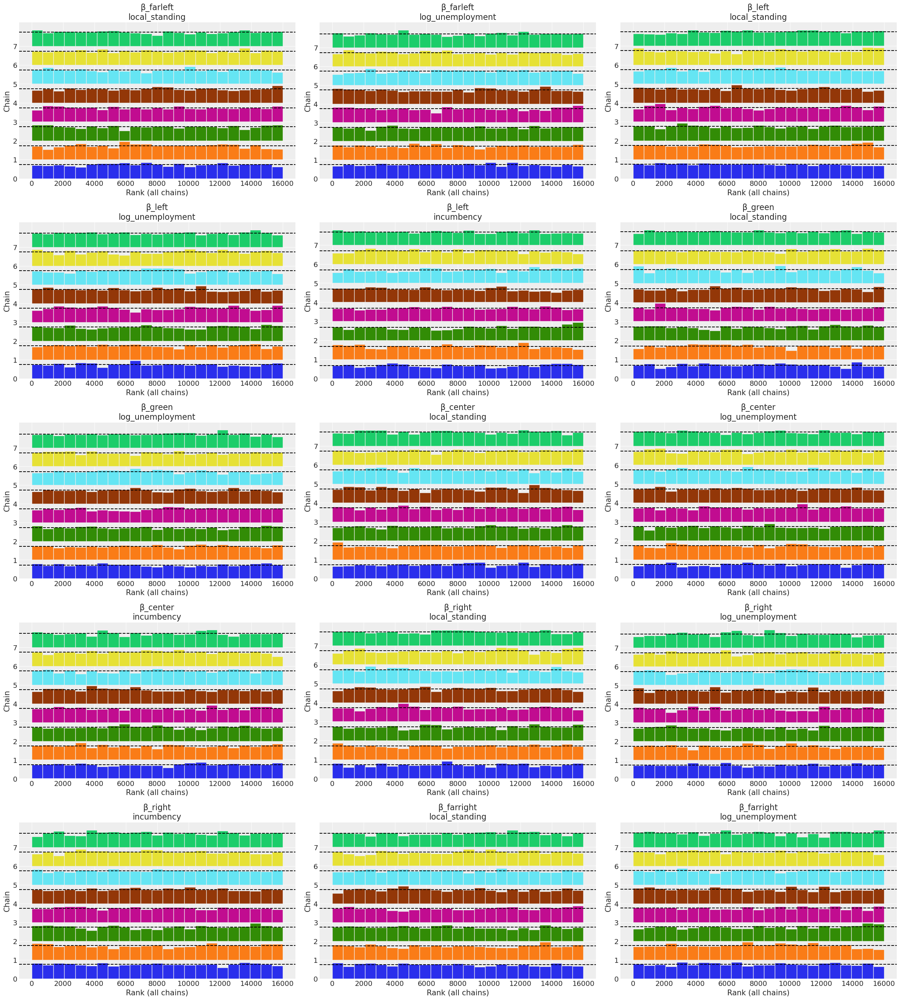

In [32]:
az.plot_rank(
    trace_prod, var_names=[f"β_{p}" for p in PARTIES[:-1]], filter_vars="regex"
);

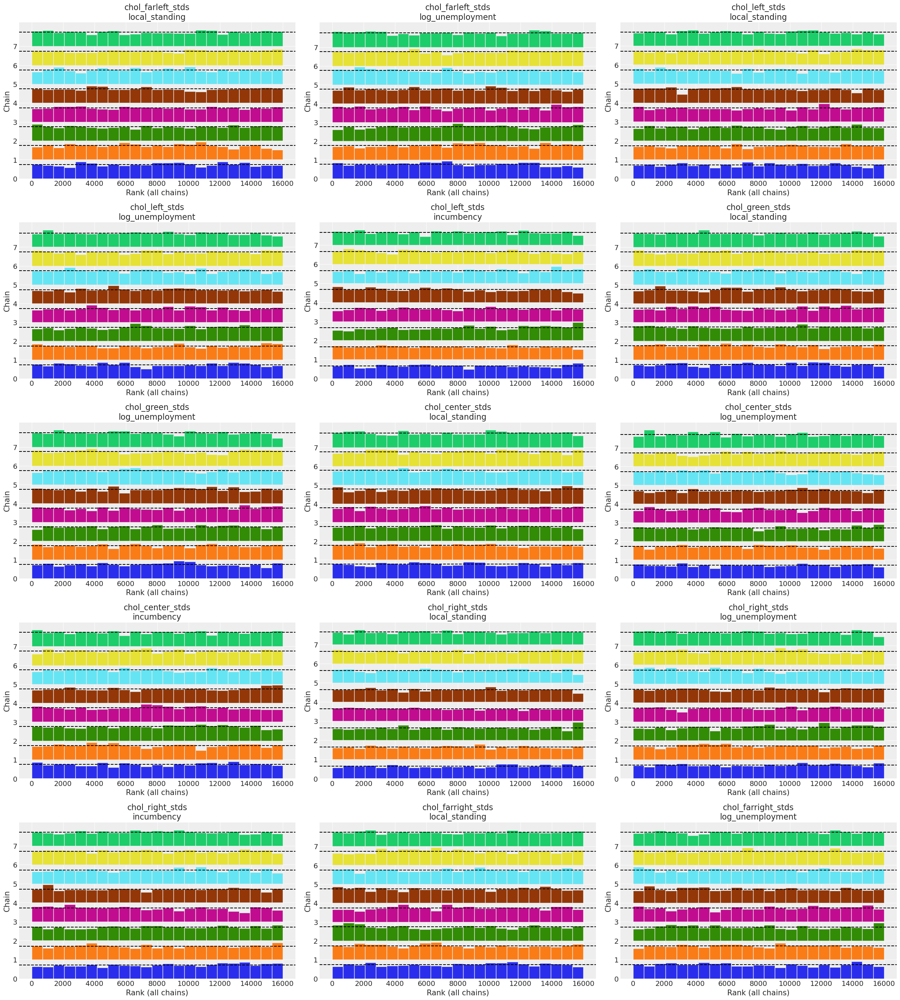

In [33]:
az.plot_rank(trace_prod, var_names=r"_stds", filter_vars="regex");

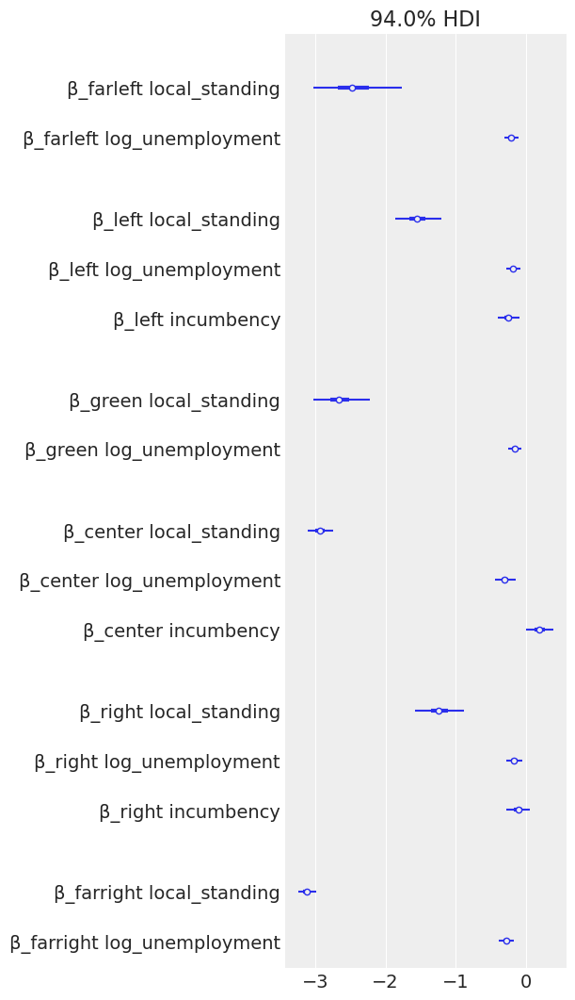

In [34]:
az.plot_forest(
    trace_prod,
    var_names=[f"β_{p}" for p in PARTIES[:-1]],
    filter_vars="regex",
    combined=True,
);

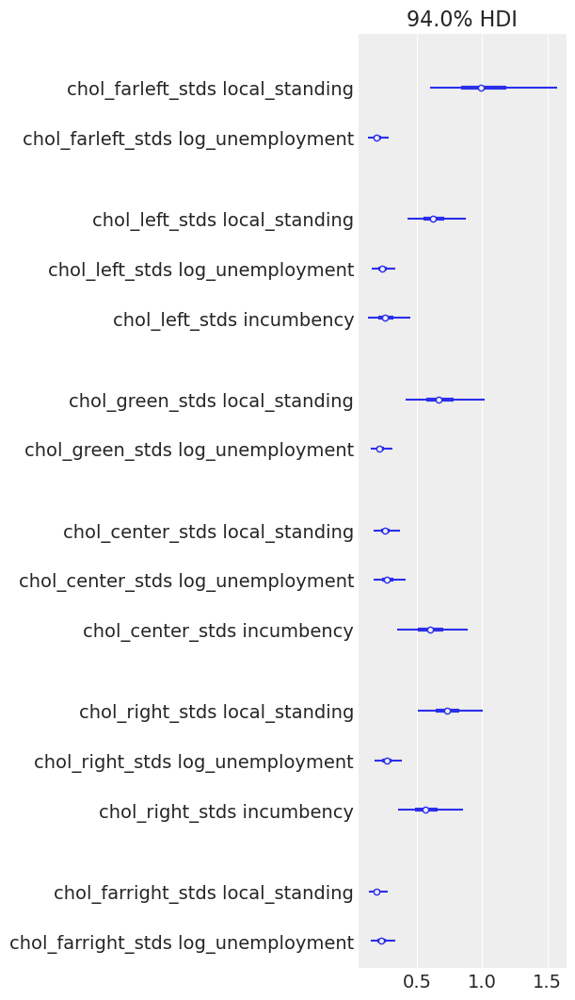

In [35]:
az.plot_forest(trace_prod, var_names=r"_stds", filter_vars="regex", combined=True);

In [36]:
az.summary(trace_prod, var_names=r"type_effect_", filter_vars="regex", round_to=2)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
type_effect_farleft[0],-1.22,0.05,-1.31,-1.13,0.0,0.0,2714.35,2685.92,2736.60,5603.04,1.00
type_effect_farleft[1],-0.24,0.05,-0.33,-0.15,0.0,0.0,2818.29,2816.71,2822.16,5643.11,1.00
type_effect_farleft[2],0.31,0.05,0.21,0.40,0.0,0.0,3105.33,3105.33,3110.62,6555.69,1.00
type_effect_farleft[3],0.78,0.05,0.69,0.88,0.0,0.0,2502.43,2502.43,2522.54,5243.87,1.01
type_effect_farleft[4],0.27,0.05,0.17,0.37,0.0,0.0,2809.26,2809.26,2806.09,6056.74,1.00
type_effect_left[0],-0.40,0.05,-0.49,-0.31,0.0,0.0,3867.36,3867.36,3864.08,6673.53,1.00
type_effect_left[1],-0.02,0.05,-0.11,0.08,0.0,0.0,3697.93,3697.93,3699.60,6865.15,1.00
type_effect_left[2],-0.67,0.05,-0.77,-0.58,0.0,0.0,3875.24,3875.24,3875.47,8320.71,1.00
type_effect_left[3],1.12,0.05,1.03,1.22,0.0,0.0,3437.45,3433.15,3435.87,6570.19,1.00
type_effect_left[4],-0.11,0.05,-0.20,-0.01,0.0,0.0,3592.53,3592.53,3594.23,7240.37,1.00


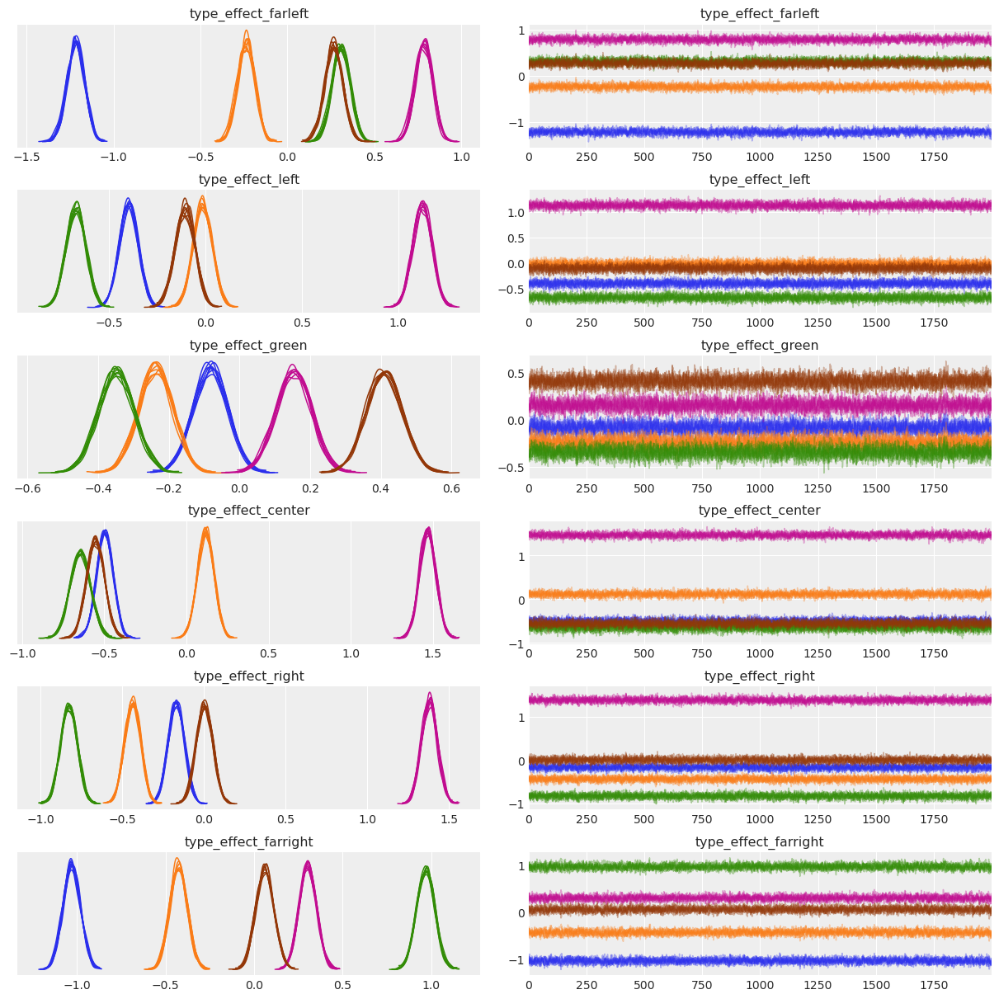

In [37]:
az.plot_trace(
    trace_prod,
    var_names=r"type_effect_",
    filter_vars="regex",
    compact=True,
    chain_prop={"ls": "-"},
);

/Users/alex_andorra/opt/anaconda3/envs/elections-models/lib/python3.8/site-packages/arviz/plots/backends/matplotlib/pairplot.py:212: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of resulting pair plots with these variables, generating only a 8x8 grid
  warnings.warn(


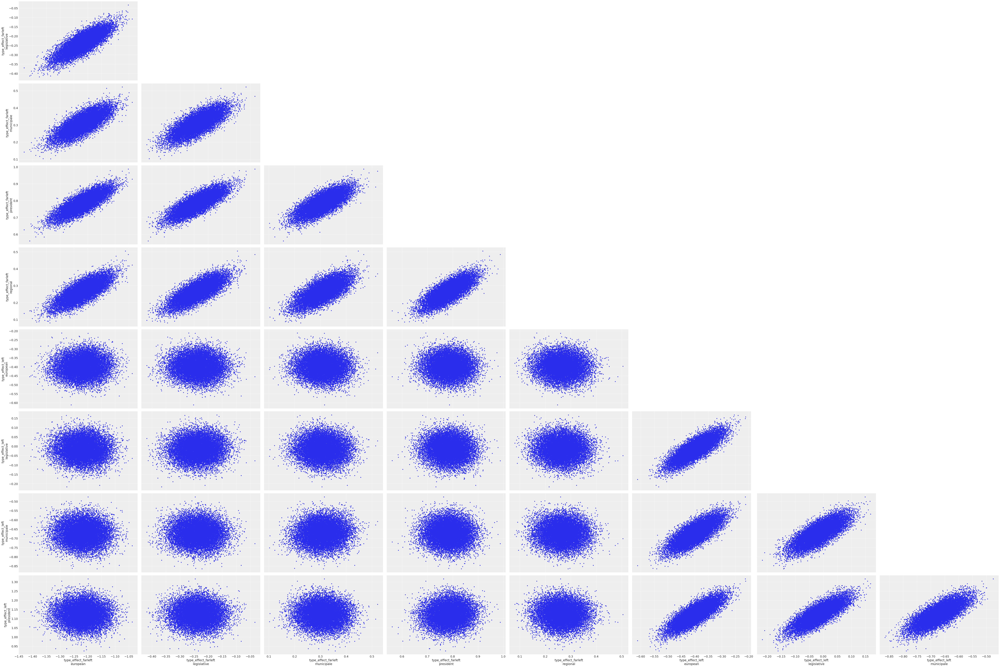

In [38]:
az.plot_pair(
    trace_prod,
    var_names=[r"type_effect_farleft", r"type_effect_left", r"type_effect_green"],
    filter_vars="regex",
    divergences=True,
);

/Users/alex_andorra/opt/anaconda3/envs/elections-models/lib/python3.8/site-packages/arviz/plots/backends/matplotlib/pairplot.py:212: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of resulting pair plots with these variables, generating only a 8x8 grid
  warnings.warn(


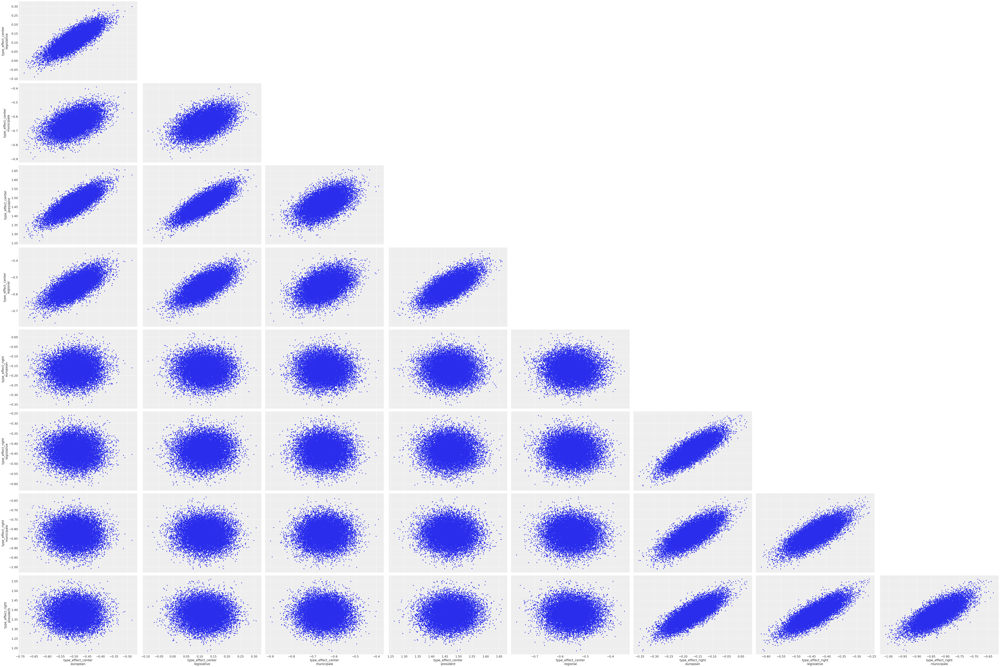

In [39]:
az.plot_pair(
    trace_prod,
    var_names=[r"type_effect_center", r"type_effect_right", r"type_effect_farright"],
    filter_vars="regex",
    divergences=True,
);

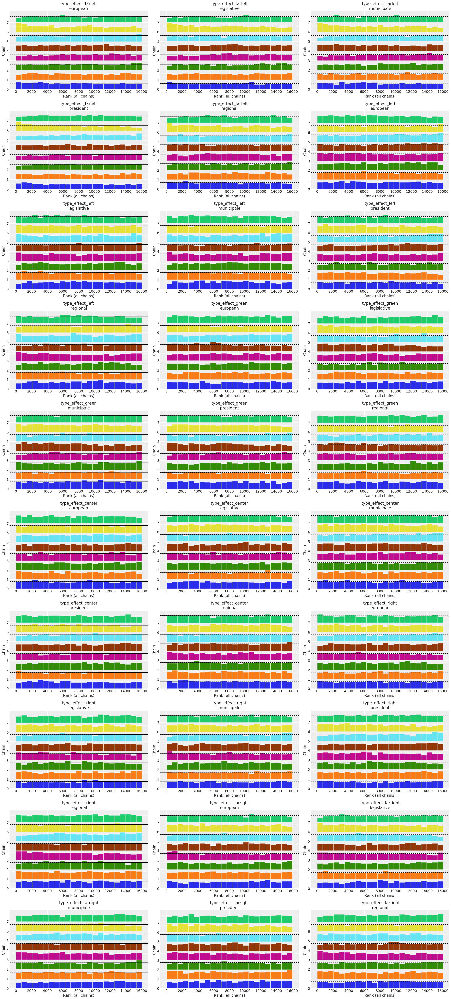

In [40]:
az.plot_rank(trace_prod, var_names=r"type_effect_", filter_vars="regex");

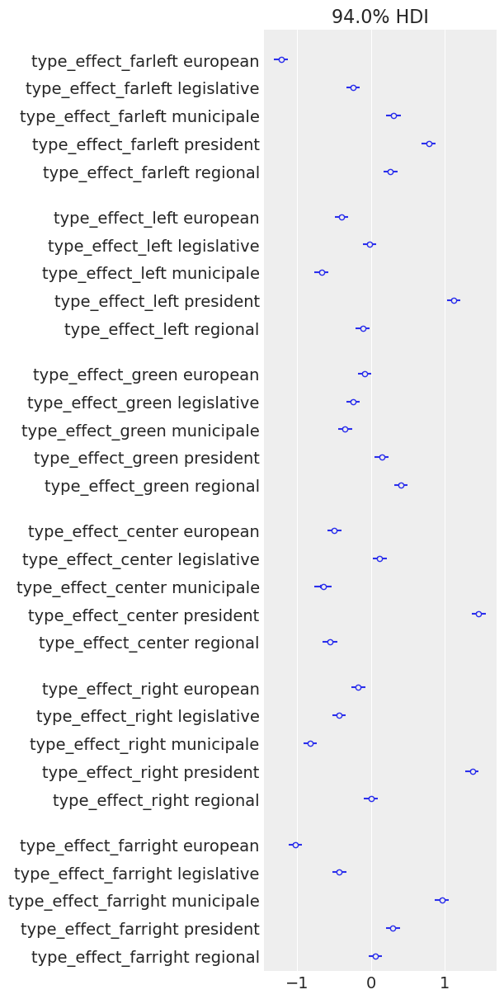

In [41]:
az.plot_forest(
    trace_prod, var_names=r"type_effect_", filter_vars="regex", combined=True
);

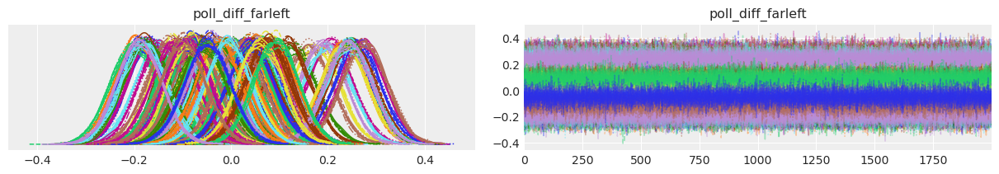

In [42]:
az.plot_trace(trace_prod, var_names="poll_diff_farleft", compact=True);

In [43]:
az.summary(trace_prod, var_names=r"poll_diff_farleft", filter_vars="regex", round_to=2)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
poll_diff_farleft[0],0.24,0.05,0.15,0.33,0.0,0.0,32614.09,31341.55,32622.95,12056.20,1.0
poll_diff_farleft[1],-0.01,0.05,-0.10,0.08,0.0,0.0,34413.41,6773.98,34413.34,11056.20,1.0
poll_diff_farleft[2],0.00,0.05,-0.09,0.09,0.0,0.0,39833.11,6170.70,39857.24,11684.86,1.0
poll_diff_farleft[3],-0.02,0.05,-0.11,0.06,0.0,0.0,35565.58,8270.57,35587.57,11485.11,1.0
poll_diff_farleft[4],-0.05,0.05,-0.14,0.03,0.0,0.0,39587.79,15818.33,39654.91,11452.62,1.0
...,...,...,...,...,...,...,...,...,...,...,...
poll_diff_farleft[216],0.06,0.05,-0.03,0.14,0.0,0.0,36299.44,18002.62,36285.88,12455.35,1.0
poll_diff_farleft[217],0.09,0.05,0.01,0.18,0.0,0.0,32301.95,24372.58,32244.32,12552.00,1.0
poll_diff_farleft[218],-0.19,0.05,-0.28,-0.11,0.0,0.0,33280.53,28948.57,33269.64,11783.73,1.0
poll_diff_farleft[219],-0.10,0.05,-0.19,-0.01,0.0,0.0,33276.74,23811.51,33258.99,11199.62,1.0


Everything went smoothly: sampling was fast, R-hats look good, the chains look good, the effective sample sizes look good, so all in all we're satisfied!

Finally, let's do some posterior retrodictive checks: for any given election, how well does our model recover the true, observed proportions by parties. In other words, how well does our model "retrodict" the data, as Richard McElreath would say. I like this denomination because it emphasizes the fact that these are not _really_ predictions, as the model was trained on the elections we're now asking it about. 

It's as if we asked a student to recite her lesson by heart and then check how much she differed from what she knows are the true answers. A good result here can be a good sign -- but how well did she _understand_ what she learned? Can she transfer her knowledge to data and situations she never saw before? As good ol' Bill Shakespeare would say: _that_ is the question. And that's basically the role of out-of-sample predictions that we'll make in another notebook.

The code below replicates one of the prior predictive checks we did above: it compares, for each party, how far the model was from the true observed proportions in each district. Each time the cell is executed, an election is chosen at random in the data used to fit the model, and the code errors out when there are no more elections to draw from.

In [44]:
post = trace_prod.posterior
share_est = post["p_district"]
share_mean = share_est.mean(("chain", "draw"))

elections = list(d.date.unique())

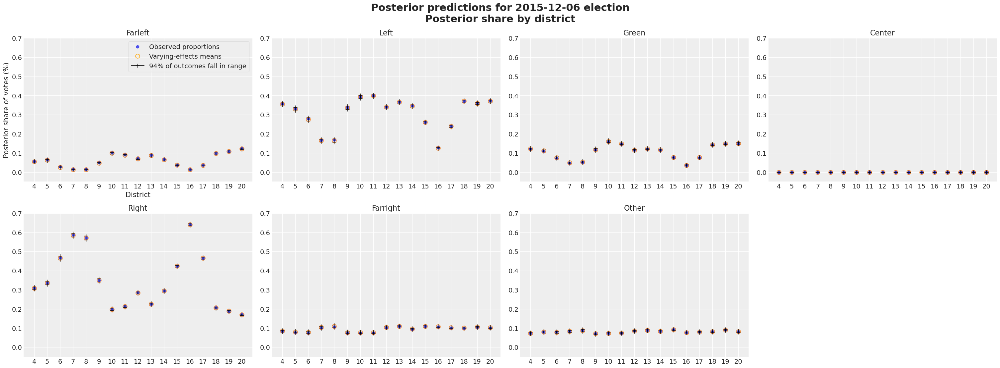

In [50]:
if len(elections) == 0:
    raise ValueError("The list of elections is empty -- no more graphs to plot!")
election = np.random.choice(elections)
elections.remove(election)
election_mask = d.date == election

fig, axes = plt.subplots(2, 4, figsize=(30, 11), constrained_layout=True)
axes = np.ravel(axes)
axes[-1].remove()
for i, ax in enumerate(axes):
    try:
        ax.plot(
            np.arange(Ndistricts),
            d.loc[election_mask, PARTIES[i]] / d.loc[election_mask, "N"],
            "o",
            ms=6,
            alpha=0.8,
            label="Observed proportions",
        )
        ax.plot(
            np.arange(Ndistricts),
            share_mean.isel(obs_id=election_mask, party_complete=i),
            "o",
            fillstyle="none",
            ms=9,
            markeredgewidth=1.5,
            alpha=0.8,
        )
        ax.plot(
            [np.arange(Ndistricts), np.arange(Ndistricts)],
            az.hdi(share_est.isel(obs_id=election_mask, party_complete=i))[
                "p_district"
            ].T,
            "k-+",
            ms=8,
            alpha=0.8,
        )
        ax.set_xticks(np.arange(Ndistricts))
        ax.set_xticklabels(districts)
        ax.set_title(f"{PARTIES[i].title()}")
        ax.set_ylim([-0.05, 0.7])

        if i == 0:
            ax.set_xlabel("District")
            ax.set_ylabel("Posterior share of votes (%)")
            ax.plot(
                [],
                "o",
                color="orange",
                fillstyle="none",
                ms=9,
                markeredgewidth=1.5,
                alpha=0.8,
                label="Varying-effects means",
            )
            ax.plot(
                [], "k-+", label="94% of outcomes fall in range", ms=8, alpha=0.8,
            )
            ax.legend(frameon=True, framealpha=0.5)
    except IndexError:
        continue
fig.suptitle(
    f"Posterior predictions for {np.datetime_as_string(election, unit='D')} election\nPosterior share by district",
    size=22,
    weight="bold",
);

These retrodictions look good, very good -- to good to be true? Maybe; we'll how it goes for Paris 2020 city-council. That's also why it's so interesting to have a model running live during an election: you don't touch it anymore and you see where it succeeds... and where it fails. And those failures teach us about how to improve the model, which assumptions were wrong after all and how to update our beliefs about the true state of the world -- an eminently iterative and Bayesian process if you think about it #DropTheMic.

In addition to this overfitting risk though, I anticipate this model has other, more important weaknesses that I want to test and improve:

1. As I said at the beginning, it is time-ignorant, i.e it assumes that each party's latent support in the population is constant in time. I assert this is not true -- there more probably are trends of support that last more or less time and then give way to other trends. If true, this is a crucial feature of the true state of the world and the model should account fot it. For now, the hierarchical structure gives enough flexibility for the model to vary by district, party and type of election. But if, one day, an election coincide with a big shift in the underlying trends, I'm betting this type of model won't adjust for it fast enough.

2. Another source of over-confidence in my opinion is the fact that the model ignores time remaining until election day. It shouldn't have the same level of confidence 60, 15 or 1 day before the election -- but right now it does.

So, there is definitely room for improvement! Granted, the uncertainty in the estimates also partly comes from the fact that the model lives in a simplex: all probabilities _must_ sum to one within each district. So, every district and every party are linked, which reduces the room for independent events -- once we learn that the left underperforms in its traditionally best districts, it becomes more probable that it did too in its least favorite districts. That's why modeling this process with a hierarchical structure and accounting for correlations between slopes and intercepts is interesting.

But if you discover other avenues of improvement or know how to solve one of the issues I layed out above, please feel free to reach out! Meanwhile, let's put this model to the test of real life. To be continued in the notebook `munic_model_analysis.ipynb`...

In [51]:
%load_ext watermark
%watermark -a AlexAndorra -n -u -v -iv

pymc3  3.9.3
numpy  1.19.1
pandas 1.0.5
arviz  0.9.0
AlexAndorra 
last updated: Fri Sep 25 2020 

CPython 3.8.5
IPython 7.17.0
